In [1]:
import os

import wandb

import numpy as np
import pandas as pd

import arviz as az
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use("arviz-darkgrid")

from tqdm.notebook import tqdm

In [2]:
data_name = "bmg"

strategies = ["one-step", "VAS"]

budget = 200
batch_size = 5
num_repeats = 10

num_iterations = budget // batch_size

In [3]:
def remove_nan(array):
    mask = ~np.isnan(array)
    return array[mask]


queried_ind = np.zeros((len(strategies), num_repeats, budget), dtype=int)
observed_labels = np.zeros((len(strategies), num_repeats, budget), dtype=int)
vs_utilities = np.zeros((len(strategies), num_repeats, num_iterations))

entity = "quanng"
project = "diverse-search"

api = wandb.Api()
runs = api.runs(
    path=f"{entity}/{project}",
    order="created_at",
    filters={"state": "finished"},
)

In [4]:
pbar = tqdm(total=queried_ind.size)

for strategy_i, strategy in enumerate(strategies):
    run_name = f"{data_name}_{budget}_{batch_size}_{strategy}"
    this_runs = [run for run in runs if run.name == run_name]
    
    for repeat_i in range(num_repeats):
        for run in this_runs:
            if run.config["seed"] == repeat_i:
                break

        history = run.history()
        
        queried_ind[strategy_i, repeat_i, :] = remove_nan(history["next_ind"].values)
        observed_labels[strategy_i, repeat_i, :] = remove_nan(history["label"].values)
        vs_utilities[strategy_i, repeat_i, :] = remove_nan(history["vs_utility"].values)
        
        pbar.update(budget)

  0%|          | 0/4000 [00:00<?, ?it/s]

In [5]:
datapath = "../../data/diverse_search"
datapath = os.path.join(datapath, data_name)

features = np.load(os.path.join(datapath, "features.npy"))
features.shape

(106810, 12)

In [6]:
from sklearn.decomposition import PCA

In [7]:
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(features)
reduced_features.shape

(106810, 2)

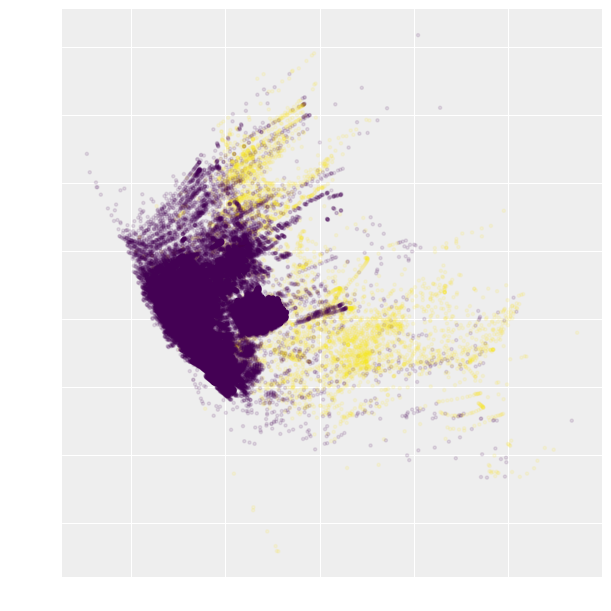

In [8]:
labels = np.load(os.path.join(datapath, "labels.npy"))

fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111)

ax.scatter(
    reduced_features[:, 0],
    reduced_features[:, 1],
    c=labels,
    s=5,
    alpha=0.1,
)

ax.tick_params(axis='x', colors=(0,0,0,0))
ax.tick_params(axis='y', colors=(0,0,0,0))

plt.show()

In [9]:
names = ["diversity-blind", "quality-weighted VS"]

In [10]:
pos_mask = labels > 0

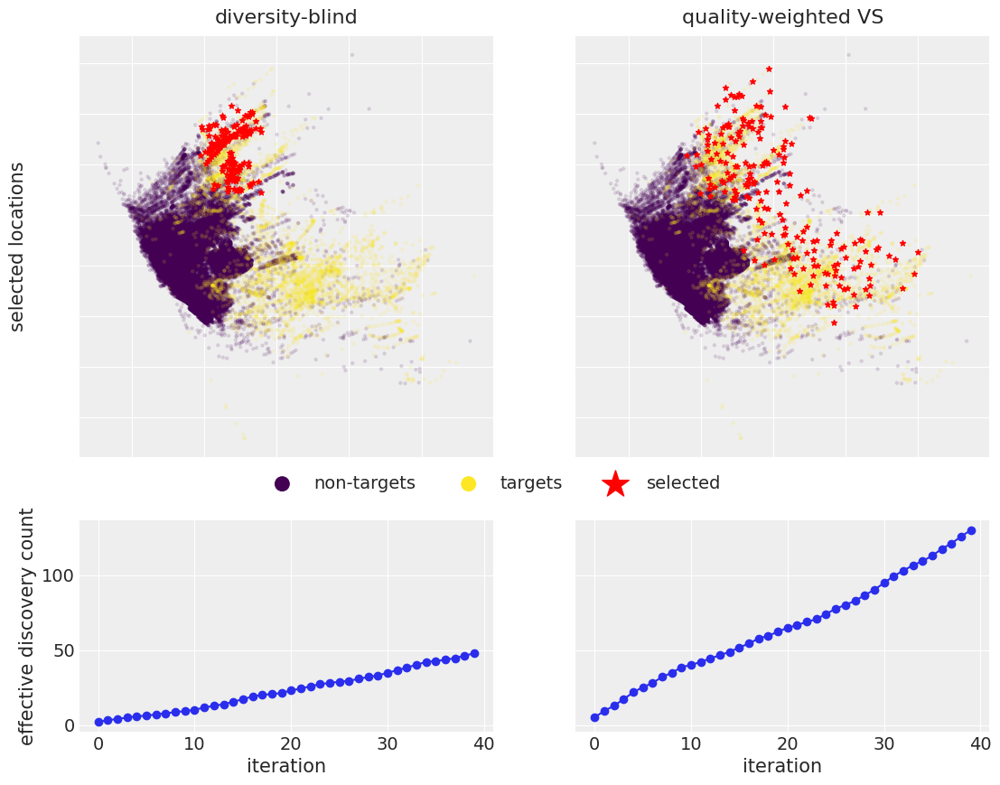

In [23]:
fig, axes = plt.subplots(
    2, 
    2, 
    figsize=(13, 10), 
    constrained_layout=False, 
    height_ratios=[2, 1], 
    sharey="row",
)

run_ind = 0

for i, ax in enumerate(axes[0]):
    ax.scatter(
        reduced_features[~pos_mask, 0],
        reduced_features[~pos_mask, 1],
        label="non-targets",
        c=np.zeros((~pos_mask).sum()),
        vmax=1,
        s=5,
        alpha=0.1,
    )
    ax.scatter(
        reduced_features[pos_mask, 0],
        reduced_features[pos_mask, 1],
        label="targets",
        c=np.ones(pos_mask.sum()),
        vmin=0,
        s=5,
        alpha=0.1,
    )
    
    ax.scatter(
        reduced_features[queried_ind[i, run_ind, :], 0],
        reduced_features[queried_ind[i, run_ind, :], 1],
        label="selected",
        c="r",
        marker="*",
        s=20,
    )

    ax.tick_params(axis='x', colors=(0,0,0,0))
    ax.tick_params(axis='y', colors=(0,0,0,0))
    
    ax.set_title(names[i], pad=10)

leg = ax.legend(
    markerscale=5,
    loc="lower center", 
    bbox_to_anchor=(-0.2, -0.12), 
    ncol=3,
)

for lh in leg.legend_handles: 
    lh.set_alpha(1)
    
for i, ax in enumerate(axes[1]):
    ax.plot(vs_utilities[i, run_ind, :], "o-")
    ax.set_xlabel("iteration")
    
axes[0, 0].set_ylabel("selected locations")
axes[1, 0].set_ylabel("effective discovery count")
    
plt.show()

/var/folders/wm/cr9_rg9d40sbj5kr5lkgwrlh0000gn/T/ipykernel_6369/353701246.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(


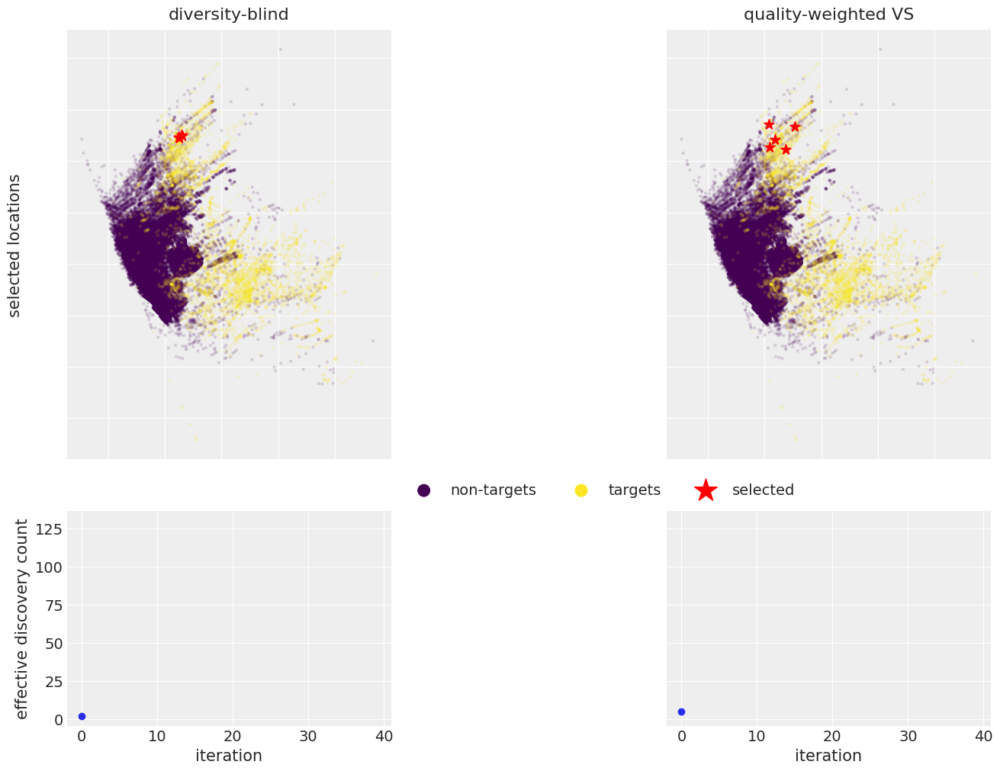

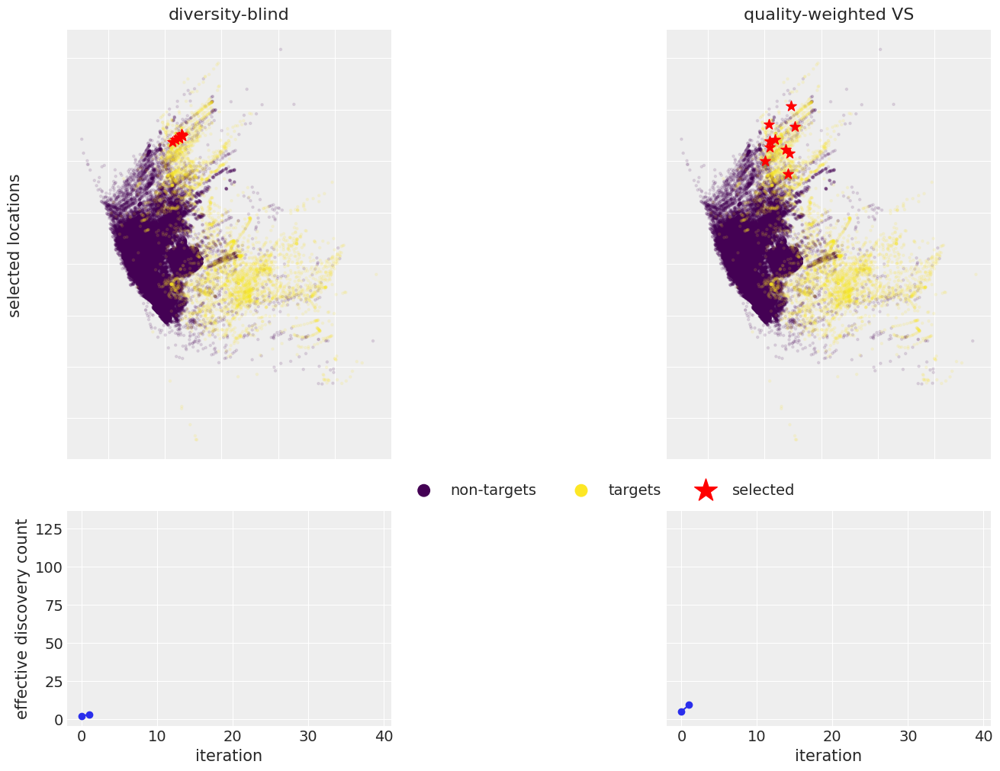

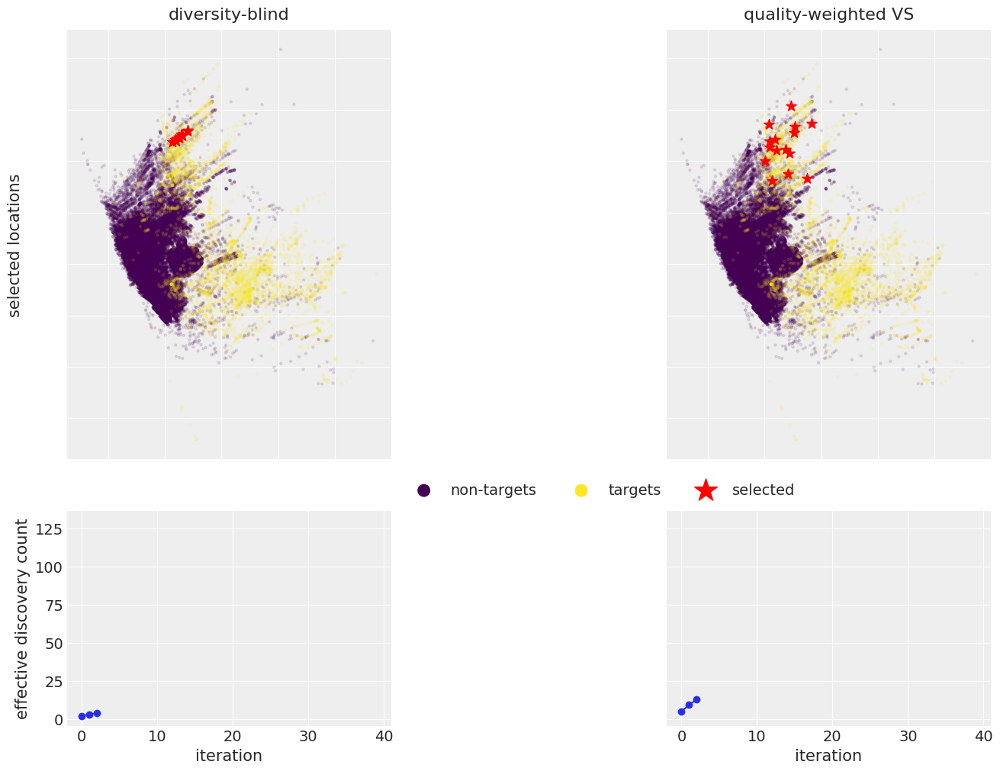

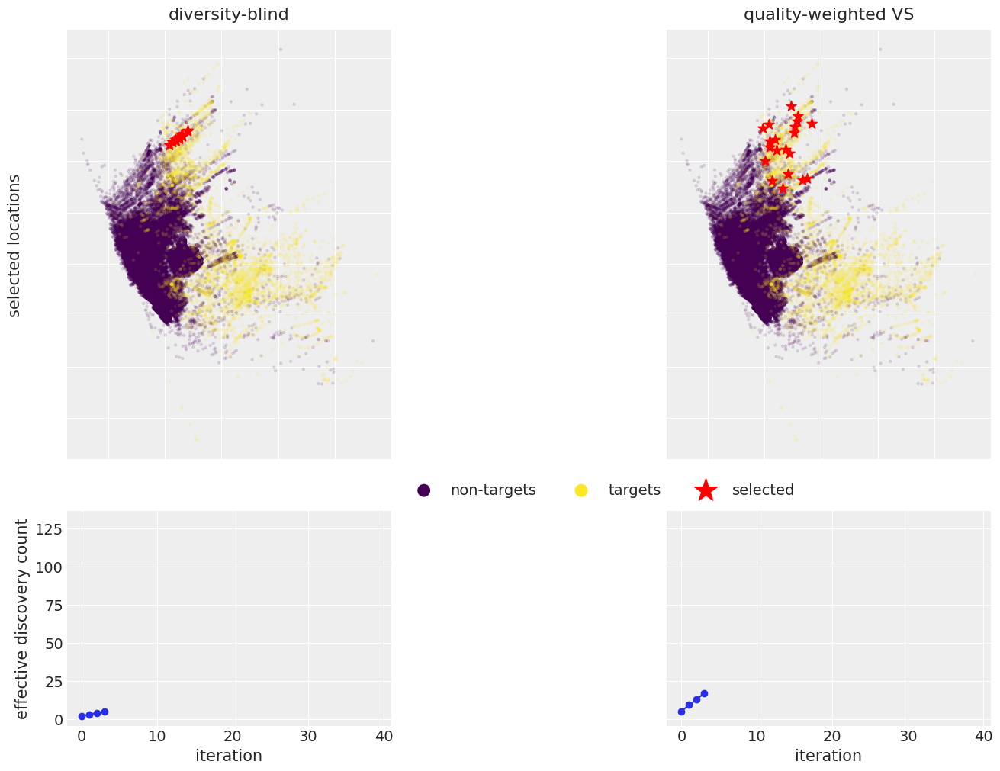

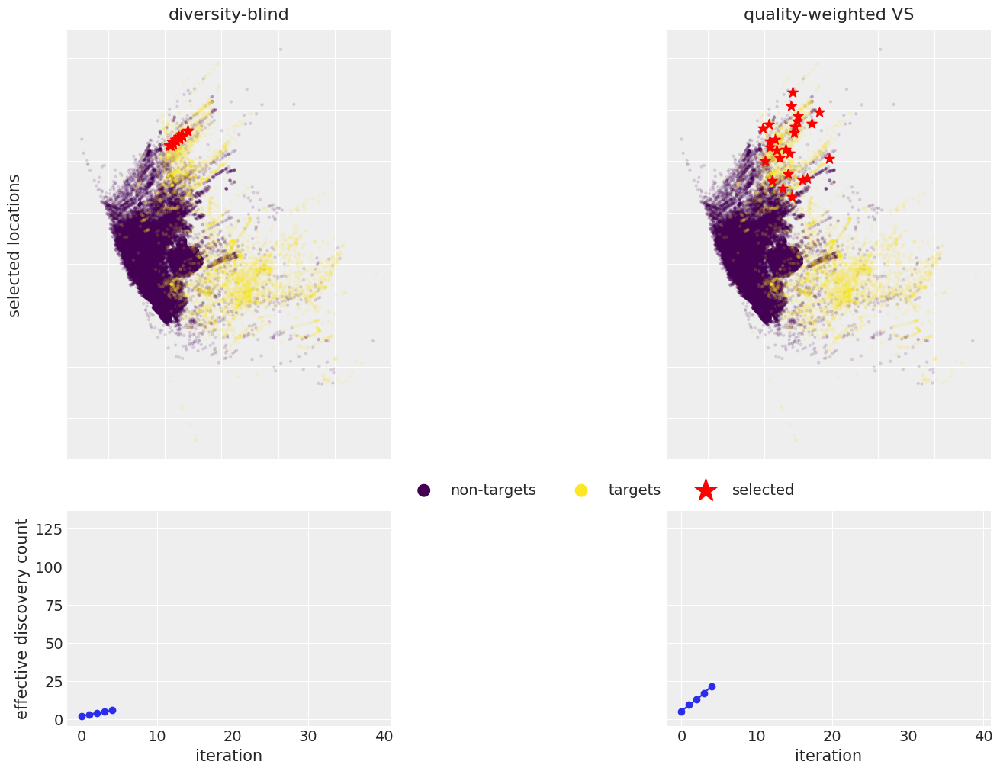

...

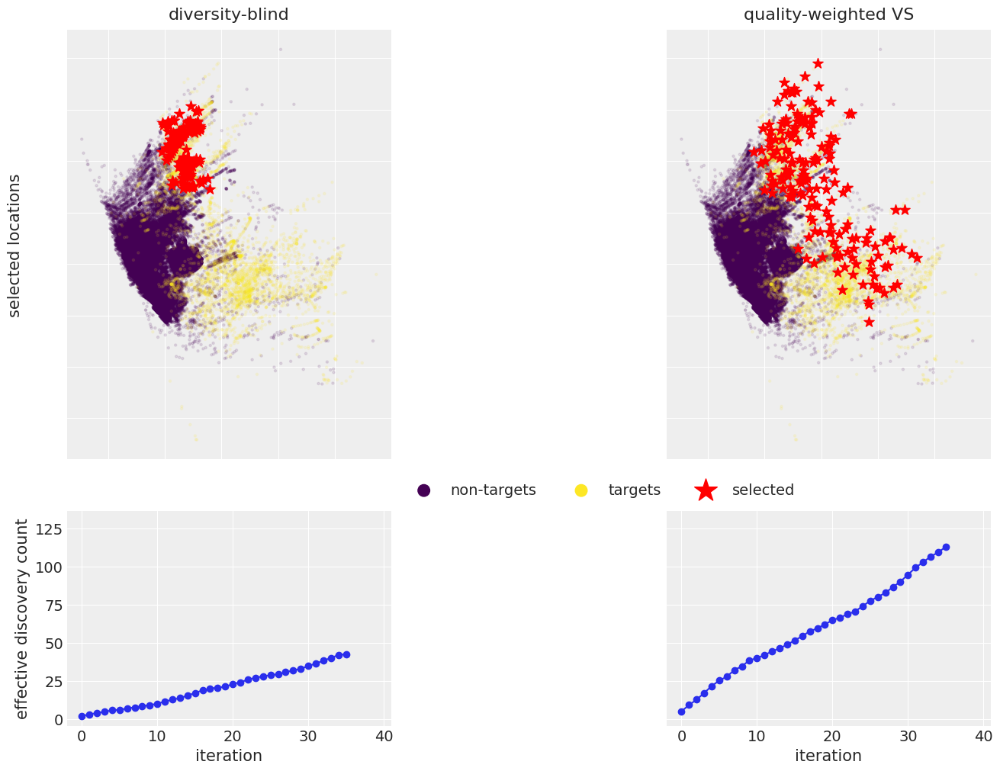

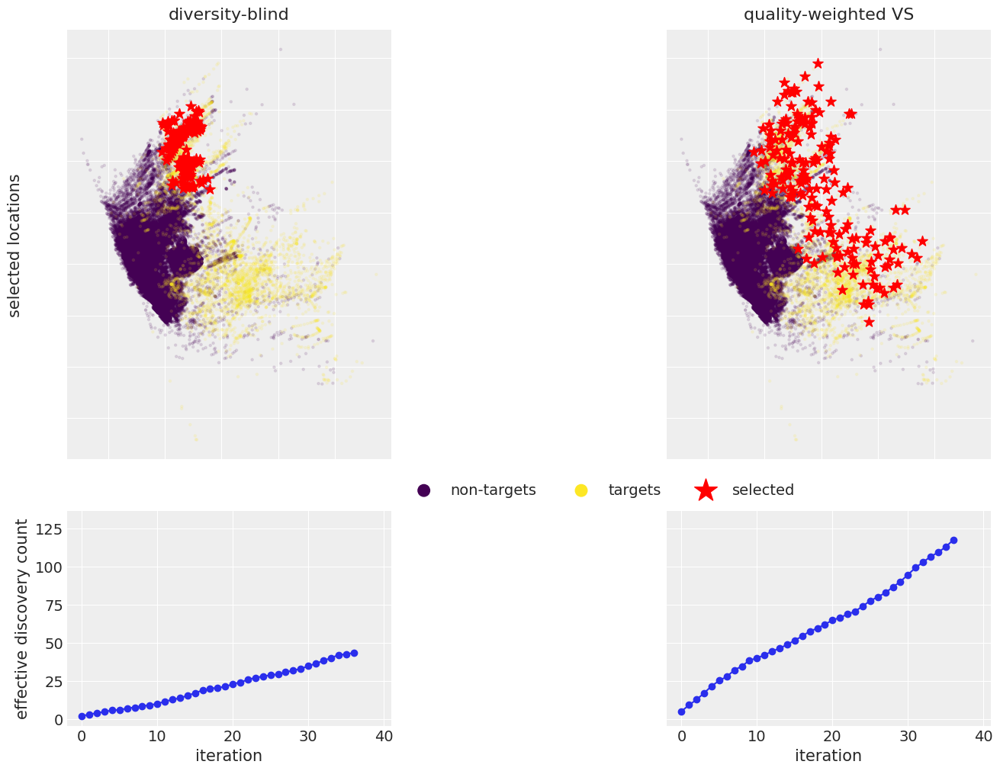

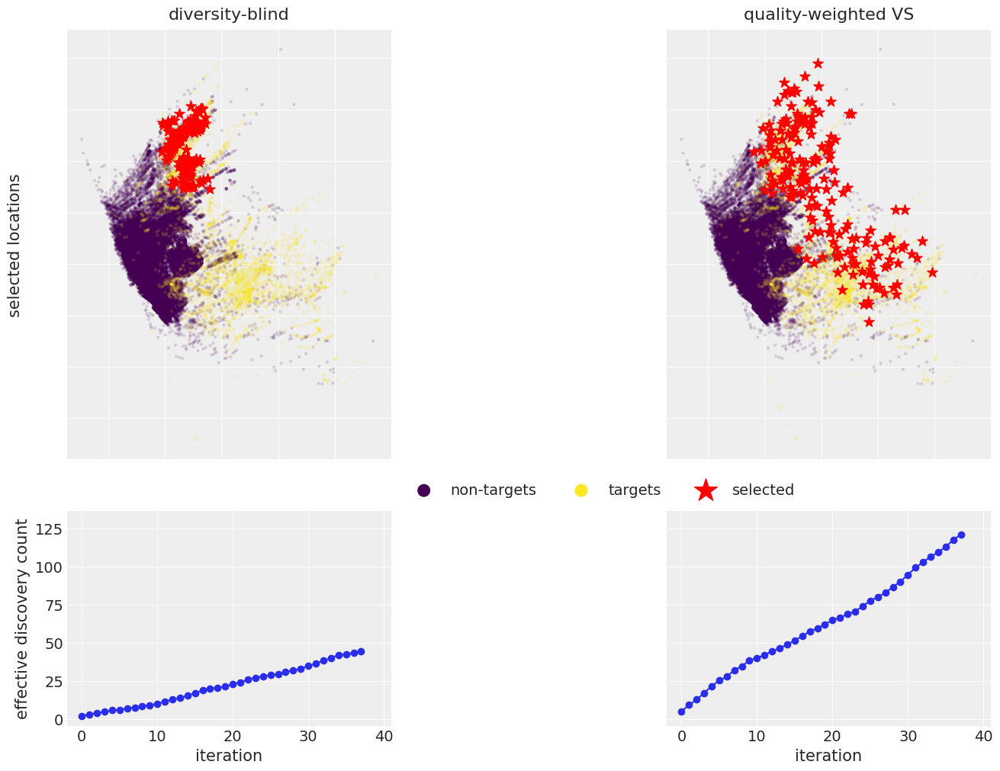

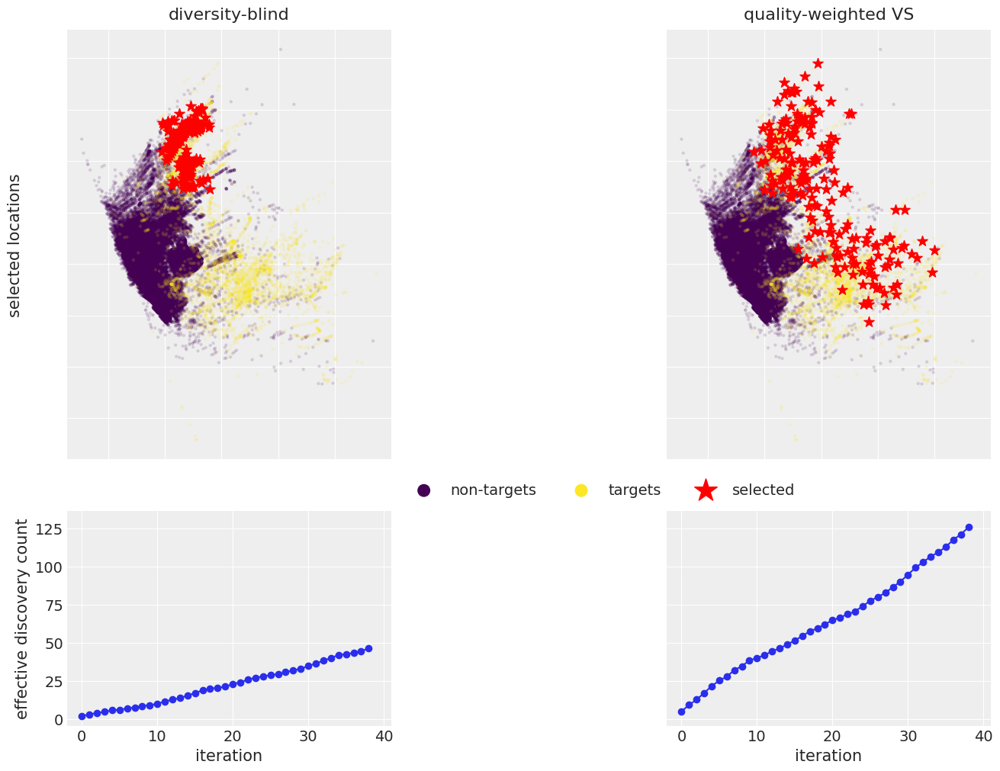

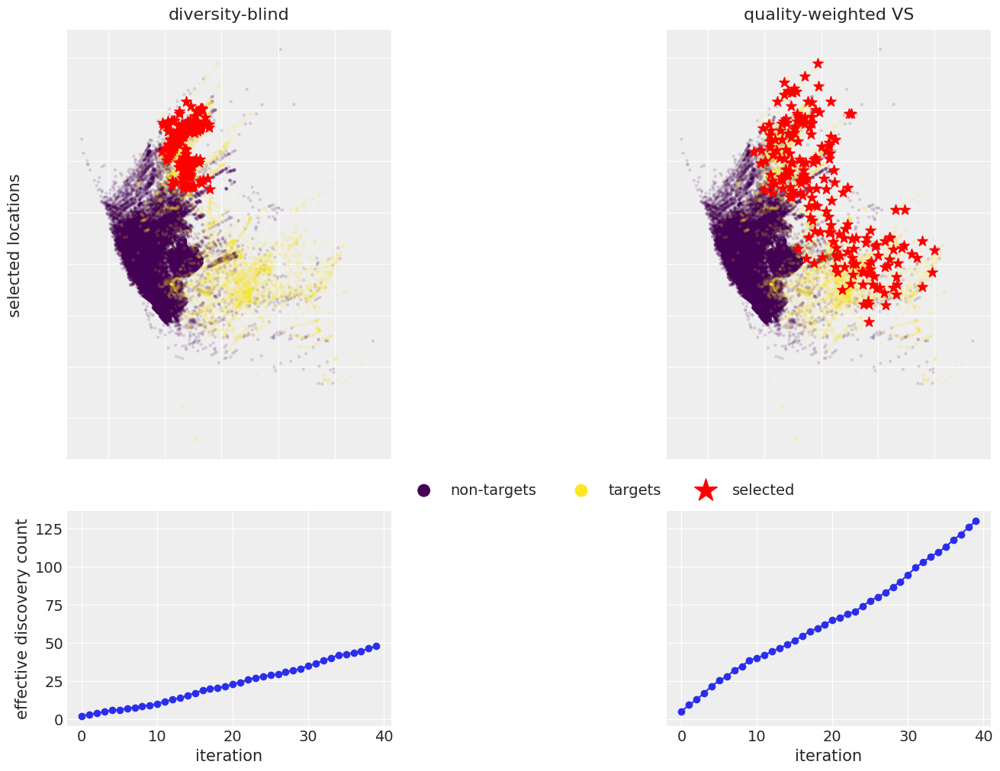

In [38]:
for iteration in range(num_iterations):
    fig, axes = plt.subplots(
        2, 
        2, 
        figsize=(13, 10), 
        constrained_layout=False, 
        height_ratios=[2, 1], 
        sharey="row",
    )

    run_ind = 0

    for i, ax in enumerate(axes[0]):
        ax.scatter(
            reduced_features[~pos_mask, 0],
            reduced_features[~pos_mask, 1],
            label="non-targets",
            c=np.zeros((~pos_mask).sum()),
            vmax=1,
            s=5,
            alpha=0.1,
        )
        ax.scatter(
            reduced_features[pos_mask, 0],
            reduced_features[pos_mask, 1],
            label="targets",
            c=np.ones(pos_mask.sum()),
            vmin=0,
            s=5,
            alpha=0.1,
        )

        ax.scatter(
            reduced_features[queried_ind[i, run_ind, :batch_size * (iteration + 1)], 0],
            reduced_features[queried_ind[i, run_ind, :batch_size * (iteration + 1)], 1],
            label="selected",
            c="r",
            marker="*",
            s=100,
        )

        ax.tick_params(axis='x', colors=(0,0,0,0))
        ax.tick_params(axis='y', colors=(0,0,0,0))

        ax.set_title(names[i], pad=10)

    leg = ax.legend(
        markerscale=5,
        loc="lower center", 
        bbox_to_anchor=(-0.2, -0.12), 
        ncol=3,
    )

    for i, lh in enumerate(leg.legend_handles): 
        lh.set_alpha(1)
    leg.legend_handles[-1]._sizes /= 5

    for i, ax in enumerate(axes[1]):
        ax.plot(vs_utilities[i, run_ind, :(iteration + 1)], "o-")
        ax.plot(vs_utilities[i, run_ind, :], "o-", alpha=0)
        ax.set_xlabel("iteration")

    axes[0, 0].set_ylabel("selected locations")
    axes[1, 0].set_ylabel("effective discovery count")

    # plt.show()
    plt.savefig(f"./output/iter{iteration:02}.png")